In [1]:
%config Completer.use_jedi = False
%matplotlib inline

In [2]:
from astropy.wcs import WCS
import healpy as hp
from pyuvdata import UVData, UVBeam, UVFlag
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import numpy as np
import glob as glob

In [3]:
import casatasks
from casatasks import importuvfits, exportfits, tclean,importfits

In [4]:
import matplotlib.image as mpimg

In [5]:
import time

In [6]:
import glob, copy

In [7]:
import uvtools

In [8]:
import matplotlib as mpl

In [9]:
import polcal, imager

# Abstract

In this notebook, we aim to summarize our progress in applying **Smirnov-Tasse** calibration algorithm ([Smirnov&Tasse 2015](https://academic.oup.com/mnras/article/449/3/2668/1117436)) on **HERA-19** data. 
<br> 
1. We pick ~10 minutes of HERA-19 data from LST **18h18m00s-18h29m50s** on Julian Date **2457548**, and use [pyuvsim](https://github.com/RadioAstronomySoftwareGroup/pyuvsim) to generate sky data from [GSM](https://github.com/telegraphic/pygdsm) with [NF's HERA Dipole_efield beam](https://github.com/HERA-Team/HERA-Beams/blob/master/NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits). 
<br>
2. We run **POLCAL** to retain the per-frequency gains on 100 channels of HERA band. We then interpolate (in real and imaginary parts independently) over these values to obtain the gain functions over the whole HERA band and apply them back to the raw data. 
3. Finally we image "**ST calibrated**" HERA-19 data via CASA. 

## data 

- The raw data are avaialable at 

`/lustre/aoc/projects/hera/jtan/HERA19/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.uvfits`

- For the so-called "raw" or "uncalibrated" data, they have actually been applied with **first** calibrations     done in [Kohn et al. 2019](https://iopscience.iop.org/article/10.3847/1538-4357/ab2f72).

- The model data are available at

`/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/lst.2457548.18h18m00s.18h29m50s.HERAband.uvfits`

- For either raw data or model data, we only keep pre-known ***good*** antennas [9,10,20,22,31,43,53,64,65,72,80,81,88,89,96,97,104,105,112] and drop ***bad*** antennas [22,43,80,81].

- All data have been phased to the same center 

| ra | dec |
| :-----------: | :-----------: |
| 4.786219554865378 | -0.5363658838626545|

- We image the uncalibrated data and model as below. 
  
  And we find the original uncalibrated data and simulated data arrange baselines differently, so that to make the two matched we need to manually conjugate the uncalibrated data. 

 E.g., baseline (1,2) in raw data is noted as (2,1) in simulated data, for visibilities we have

 $1x^* 2x\rightarrow 2x^* 1x, 1y^* 2y\rightarrow 2y^* 1y, 1x^* 2y\rightarrow 2y^* 1x, 1y^* 2x\rightarrow 2x^* 1y$.

 Thus the ***new*** raw data is constructed as 

 $\text{new} \, V_{xx} = \text{old} \, V_{xx}^* \,,\, \text{new} \, V_{yy} = \text{old} \, V_{yy}^* \,, \text{new} \, V_{xy} = \text{old} \, V_{yx}^* \,, \text{new} \, V_{yx} = \text{old} \, V_{xy}^* \,.$ 

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


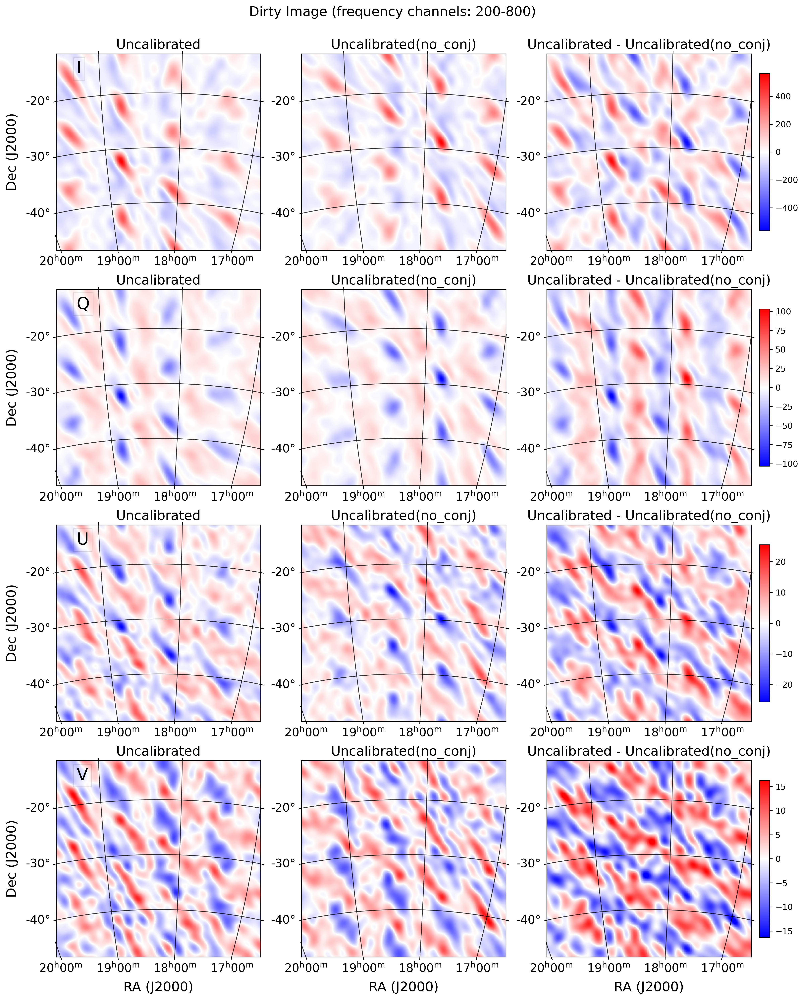

In [28]:
spec_window = (200,800)
imager.plot_image_difference("/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.{}_{}.fits".format(*spec_window), \
                     "/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.{}_{}.fits".format(*spec_window), \
                     name_1="Uncalibrated", name_2="Uncalibrated(no_conj)", reference="2", title="Dirty Image (frequency channels: {}-{})".format(*spec_window))

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


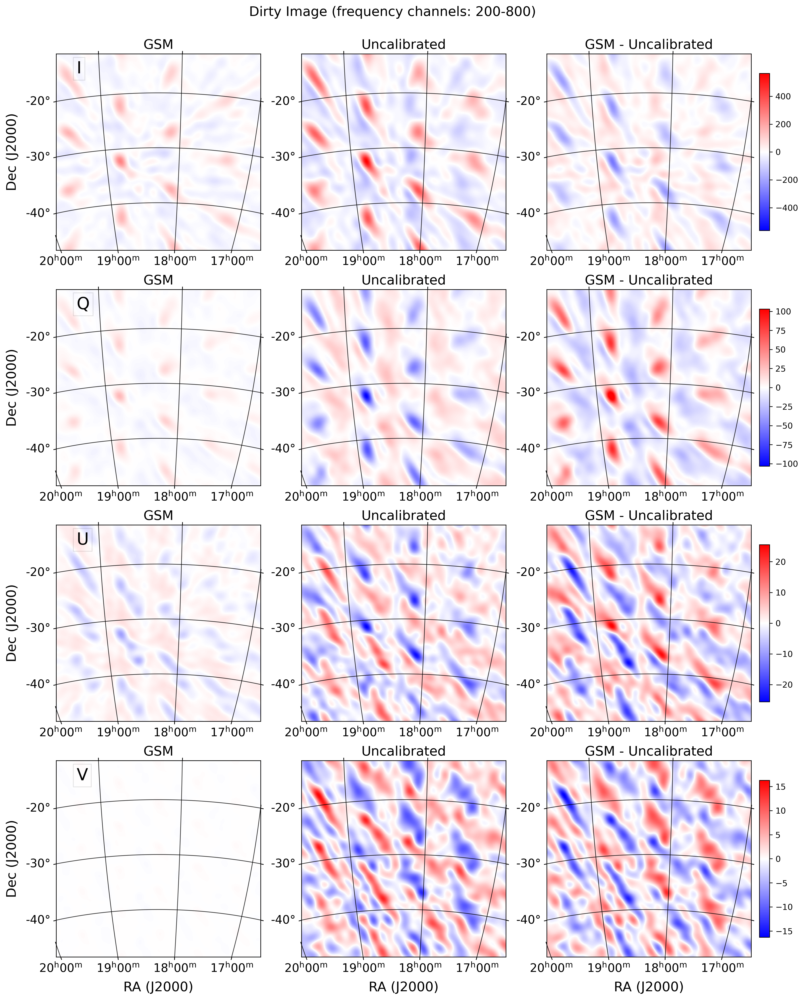

In [29]:
spec_window = (200,800)
imager.plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.HERAband.{}_{}.fits".format(*spec_window), \
                     "/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.{}_{}.fits".format(*spec_window), \
                     name_1="GSM", name_2="Uncalibrated", reference="2", title="Dirty Image (frequency channels: {}-{})".format(*spec_window))

## Calibration

- After calibrating on simulated sky data from original [beam](https://github.com/HERA-Team/HERA-Beams/blob/master/NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits), we find the gain solutions turn out to have **large D-terms**. 
 
  We suspect this discrepancy may due to mismatched feeds between real data and model data. Therefore we propose to **revert** the dipole of the original [beam](https://github.com/HERA-Team/HERA-Beams/blob/master/NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits). 
  
  Below we show the comparison of gain matrices when calibrating on the old simulated data and the new simulated data. 

In [10]:
gains_raw_conj_on_sim, gains_raw_conj_on_sim_r = np.load("new_2457548_iterated_gains_raw_conj_on_sim.npy"),  \
np.load("new_2457548_iterated_gains_raw_conj_on_sim_r.npy")

Text(0.5, 1.0, 'new beam')

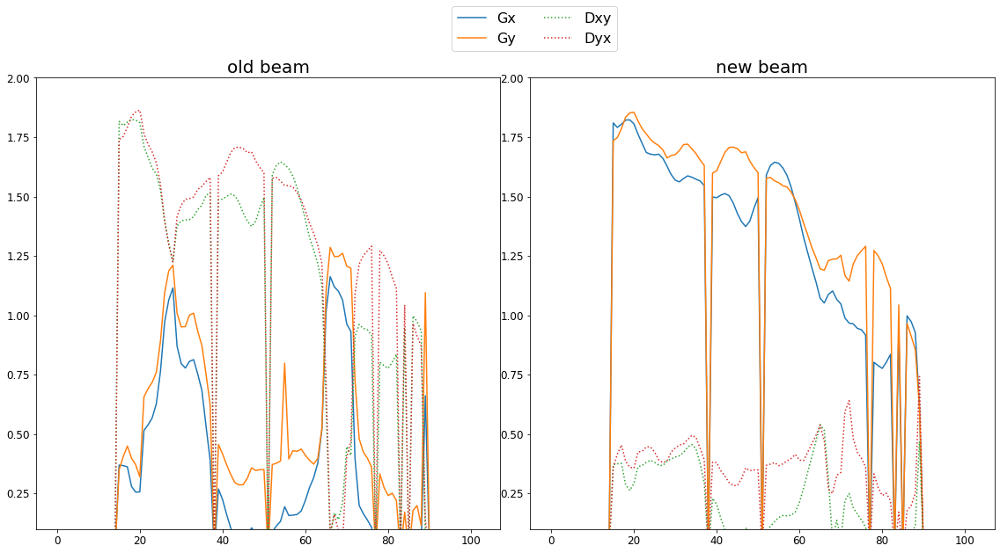

In [31]:
# new figure
fig, axes = plt.subplots(figsize=(16,8), ncols=2, nrows=1)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, hspace=0.2)
ant = 2
ax = axes[0]
ax.plot(np.abs(gains_raw_conj_on_sim[:,-1,ant,0,0]), label="Gx")
ax.plot(np.abs(gains_raw_conj_on_sim[:,-1,ant,1,1]), label="Gy")
ax.plot(np.abs(gains_raw_conj_on_sim[:,-1,ant,0,1]), ls=":", label="Dxy")
ax.plot(np.abs(gains_raw_conj_on_sim[:,-1,ant,1,0]), ls=":", label="Dyx")
ax.tick_params(axis='both', which='both', labelsize=12)
ax.set_ylim(1e-1,2)
ax.set_title("old beam", fontsize=20)

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=16, ncol=2,)
fig.tight_layout()

ax = axes[1]
ax.plot(np.abs(gains_raw_conj_on_sim_r[:,-1,ant,0,0]))
ax.plot(np.abs(gains_raw_conj_on_sim_r[:,-1,ant,1,1]))
ax.plot(np.abs(gains_raw_conj_on_sim_r[:,-1,ant,0,1]), ls=":")
ax.plot(np.abs(gains_raw_conj_on_sim_r[:,-1,ant,1,0]), ls=":")
ax.tick_params(axis='both', which='both', labelsize=12)
ax.set_ylim(1e-1,2)
ax.set_title("new beam", fontsize=20)

- The differences between the old simulation and the new simulation are only in Q and V, as expected.

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


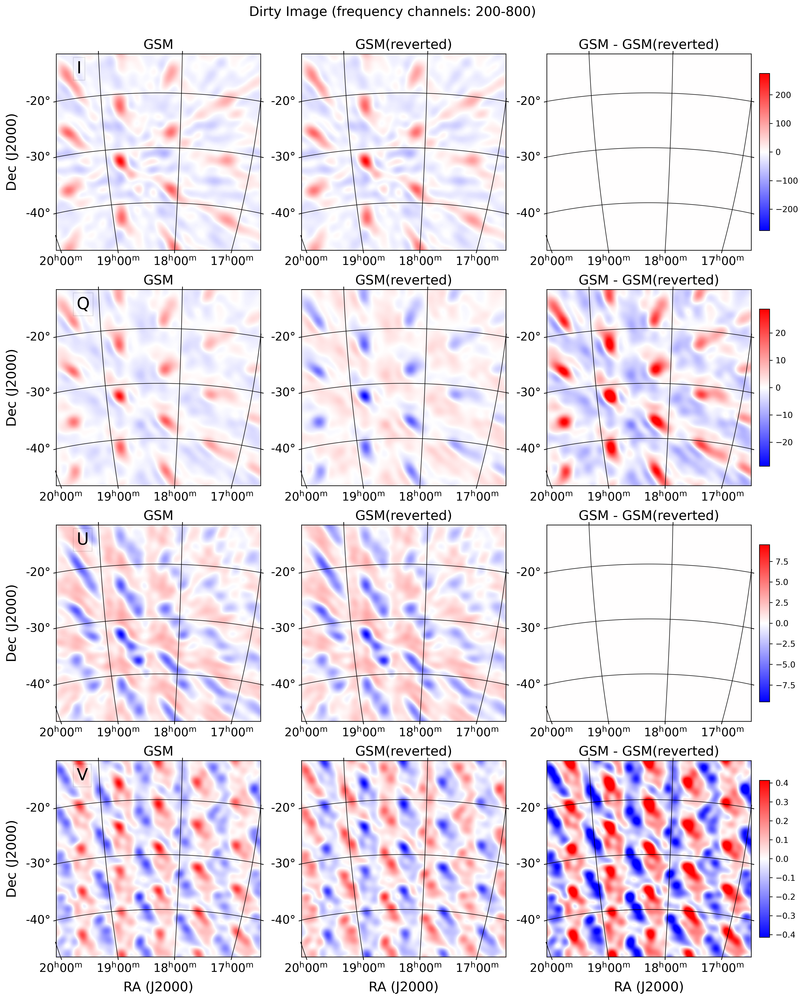

In [30]:
spec_window = (200,800)
imager.plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.HERAband.{}_{}.fits".format(*spec_window), \
                     "/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.HERAband.reverted.dipole.{}_{}.fits".format(*spec_window), \
                     name_1="GSM", name_2="GSM(reverted)", reference="2", title="Dirty Image (frequency channels: {}-{})".format(*spec_window))

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


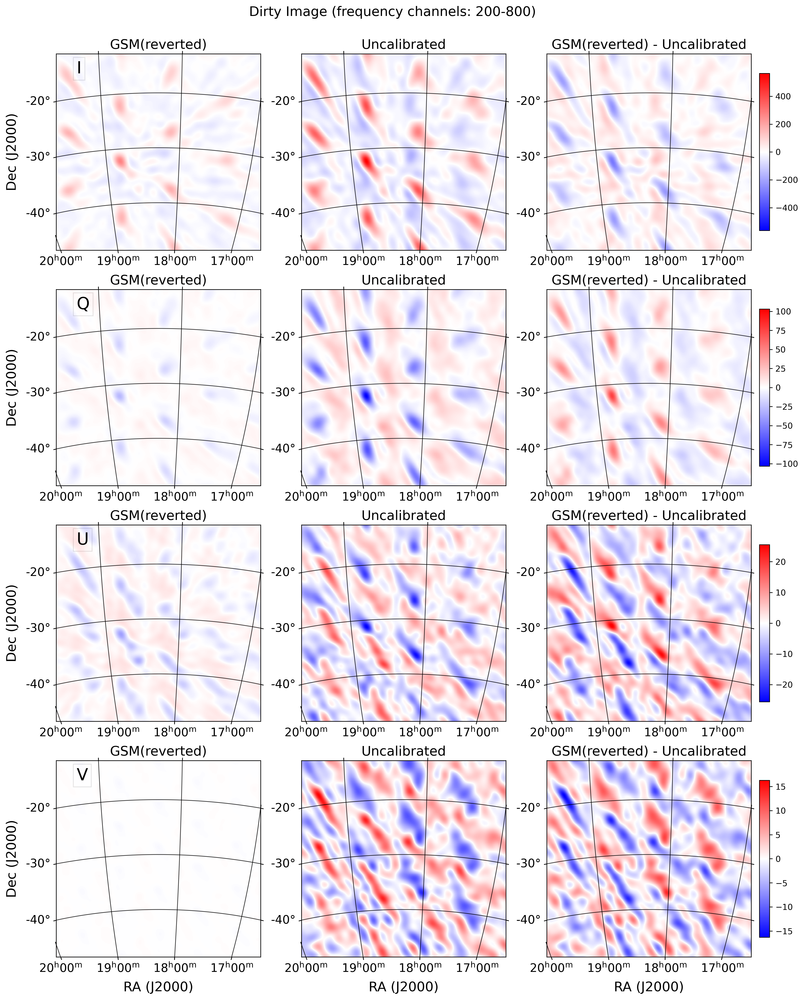

In [31]:
spec_window = (200,800)
imager.plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.HERAband.reverted.dipole.{}_{}.fits".format(*spec_window), \
                     "/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.{}_{}.fits".format(*spec_window), \
                     name_1="GSM(reverted)", name_2="Uncalibrated", reference="2", title="Dirty Image (frequency channels: {}-{})".format(*spec_window))

- We smooth the gains before applying them on the uncalibrated data.

In [11]:
new_gains_raw_conj_on_sim_r = np.zeros((1024, 15, 2, 2)).astype(np.complex128)

In [12]:
freqs = np.arange(1,1024,10)

In [13]:
new_gains_raw_conj_on_sim_r[freqs,:,:,:] = gains_raw_conj_on_sim_r[:,-1,:,:,:]

In [14]:
new_gains_raw_conj_on_sim_r = np.transpose(new_gains_raw_conj_on_sim_r, (1,0,2,3))

In [15]:
interpolated_gains_raw_conj_on_sim_r, interpolated_freq_index_raw_conj_on_sim_r = polcal.gain_array_interpolate(new_gains_raw_conj_on_sim_r, freqs)

In [22]:
ants_list = [  9,  10,  20,  31,  53,  64,  65,  72,  88,  89,  96,  97, 104, 105, 112]

- Before smoothing

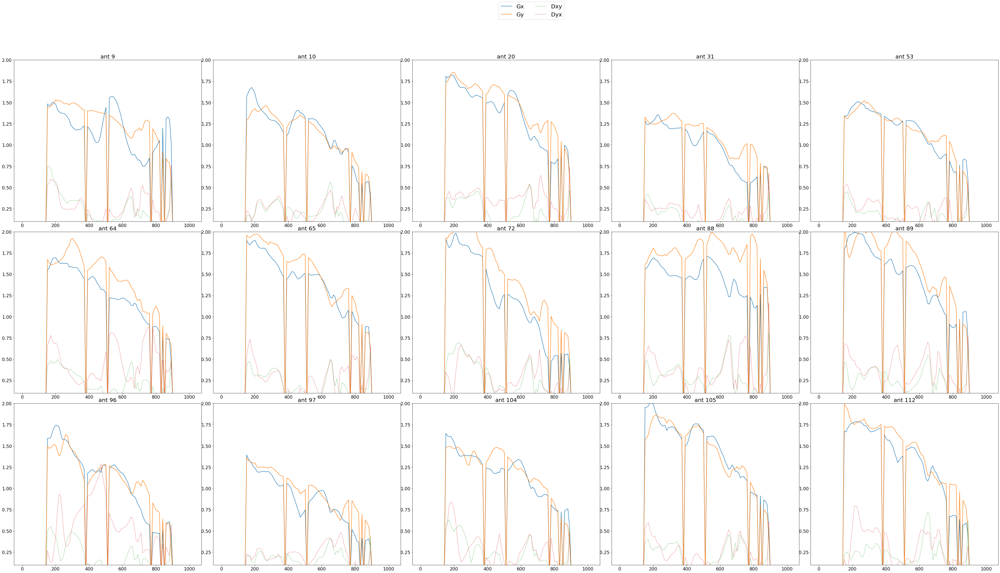

In [26]:
fig, axes = plt.subplots(figsize=(50,26), ncols=5, nrows=3)
for ant_index in range(15):
    row_index = np.int(ant_index / 5)
    col_index = ant_index  - 5*row_index
    ax = axes[row_index,col_index]
    ax.plot(freqs,np.abs(new_gains_raw_conj_on_sim_r [ant_index,freqs,0,0]), label="Gx")
    ax.plot(freqs,np.abs(new_gains_raw_conj_on_sim_r [ant_index,freqs,1,1]), label="Gy")
    ax.plot(freqs,np.abs(new_gains_raw_conj_on_sim_r [ant_index,freqs,0,1]), ls=":", label="Dxy")
    ax.plot(freqs,np.abs(new_gains_raw_conj_on_sim_r [ant_index,freqs,1,0]), ls=":", label="Dyx")
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_ylim(1e-1,2)
    ax.set_title("ant {}".format(ants_list[ant_index]), fontsize=20)
    if ant_index == 0:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=20, ncol=2,)
        fig.tight_layout()

- After smoothing

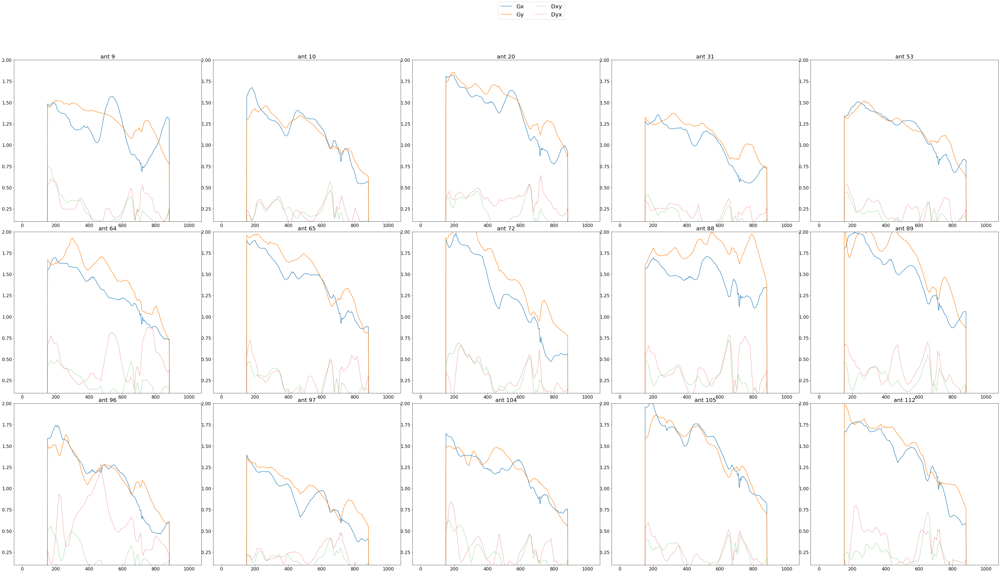

In [27]:
fig, axes = plt.subplots(figsize=(50,26), ncols=5, nrows=3)
for ant_index in range(15):
    row_index = np.int(ant_index / 5)
    col_index = ant_index  - 5*row_index
    ax = axes[row_index,col_index]
    ax.plot(np.abs(interpolated_gains_raw_conj_on_sim_r [ant_index,:,0,0]), label="Gx")
    ax.plot(np.abs(interpolated_gains_raw_conj_on_sim_r [ant_index,:,1,1]), label="Gy")
    ax.plot(np.abs(interpolated_gains_raw_conj_on_sim_r [ant_index,:,0,1]), ls=":", label="Dxy")
    ax.plot(np.abs(interpolated_gains_raw_conj_on_sim_r [ant_index,:,1,0]), ls=":", label="Dyx")
    ax.tick_params(axis='both', which='both', labelsize=16)
    ax.set_ylim(1e-1,2)
    ax.set_title("ant {}".format(ants_list[ant_index]), fontsize=20)
    if ant_index == 0:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=20, ncol=2,)
        fig.tight_layout()

## Imaging

We make dirty images using information only from frequency channels 200-800 

In [37]:
uvd_raw_conj_cal_sim_r = UVData()
uvd_raw_conj_cal_sim_r.read('/lustre/aoc/projects/hera/jtan/HERA19calibrated/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.cal.reverted_dipole.uvfits')

In [38]:
spec_window = (200,800)
uvd_new = uvd_raw_conj_cal_sim_r.select(freq_chans=list(range(*spec_window)), inplace=False)
uvd_new.write_uvfits('/lustre/aoc/projects/hera/jtan/HERA19calibrated/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.cal.reverted_dipole.{}_{}.uvfits'.format(*spec_window))

In [41]:
spec_window = (200,800)
filename = '/lustre/aoc/projects/hera/jtan/HERA19calibrated/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.cal.reverted_dipole.{}_{}.uvfits'.format(*spec_window)
imager.uvh5_2_fits(filename, '/lustre/aoc/projects/hera/jtan/HERA19calibrated/images/', ra=uvd_raw_conj_cal_sim_r.phase_center_ra, dec=uvd_raw_conj_cal_sim_r.phase_center_dec, cell=['250 arcsec'])

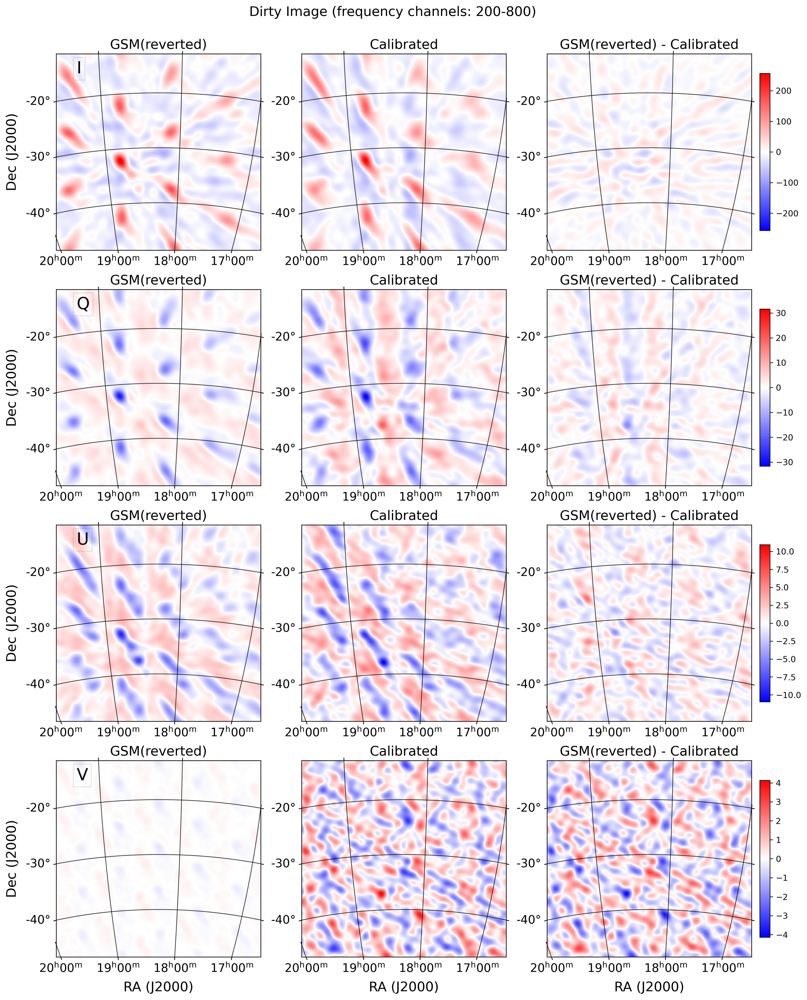

In [44]:
spec_window = (200,800)
imager.plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.HERAband.reverted.dipole.{}_{}.fits".format(*spec_window), \
                     '/lustre/aoc/projects/hera/jtan/HERA19calibrated/images/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.cal.reverted_dipole.{}_{}.fits'.format(*spec_window), \
                     name_1="GSM(reverted)", name_2="Calibrated", reference="2", title="Dirty Image (frequency channels: {}-{})".format(*spec_window))

## Angular Power Spectrum

In [10]:
uvd_model, uvd_uncal, uvd_cal = UVData(), UVData(), UVData()
uvd_uncal.read("/lustre/aoc/projects/hera/jtan/HERA19/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.uvfits")
uvd_model.read("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/lst.2457548.18h18m00s.18h29m50s.HERAband.uvfits")
uvd_cal.read("/lustre/aoc/projects/hera/jtan/HERA19calibrated/lst.2457548.18h18m00s.18h29m50s.uvcRP.phased.conj.cal.reverted_dipole.uvfits")

In [13]:
from astropy import units as u, constants as c

In [22]:
from scipy.stats import binned_statistic

In [14]:
wvls = (c.c/(uvd_model.freq_array*u.Hz)).to(u.m).value.squeeze()

In [17]:
uvws = np.ones([uvd_model.Nblts, uvd_model.Nfreqs, 3])
for i in np.arange(uvd_model.Nfreqs):
    uvws[:,i,:] = uvd_model.uvw_array/wvls[i]

In [23]:
u_mag = np.sqrt(np.sum(uvws**2, axis=2)).flatten()

In [50]:
vis_mag_model = np.abs(uvd_model.data_array/~uvd_model.flag_array)[:,0,:,0].flatten()**2
to_use = np.logical_and(np.isfinite(vis_mag_model), u_mag > 0)
u_mag_model = u_mag[to_use]
vis_mag_model = vis_mag_model[to_use]

bs_model = binned_statistic(u_mag_model, vis_mag_model,  
                      statistic='mean', bins=30, range=None)
bs_l_model = 2.*np.pi*(bs_model.bin_edges[1:]+bs_model.bin_edges[0:-1])/2
bs_vis_model = bs_model.statistic

divide by zero encountered in true_divide


In [51]:
vis_mag_uncal = np.abs(uvd_uncal.data_array/~uvd_uncal.flag_array)[:,0,:,0].flatten()**2
to_use = np.logical_and(np.isfinite(vis_mag_uncal), u_mag > 0)
u_mag_uncal = u_mag[to_use]
vis_mag_uncal = vis_mag_uncal[to_use]

bs_uncal = binned_statistic(u_mag_uncal, vis_mag_uncal,  
                      statistic='mean', bins=30, range=None)
bs_l_uncal = 2.*np.pi*(bs_uncal.bin_edges[1:]+bs_uncal.bin_edges[0:-1])/2
bs_vis_uncal = bs_uncal.statistic

divide by zero encountered in true_divide
invalid value encountered in true_divide


In [52]:
vis_mag_cal = np.abs(uvd_cal.data_array/~uvd_cal.flag_array)[:,0,:,0].flatten()**2
to_use = np.logical_and(np.isfinite(vis_mag_cal), u_mag > 0)
u_mag_cal = u_mag[to_use]
vis_mag_cal = vis_mag_cal[to_use]

bs_cal = binned_statistic(u_mag_cal, vis_mag_cal,  
                      statistic='mean', bins=30, range=None)
bs_l_cal = 2.*np.pi*(bs_cal.bin_edges[1:]+bs_cal.bin_edges[0:-1])/2
bs_vis_cal = bs_cal.statistic

divide by zero encountered in true_divide
invalid value encountered in true_divide
overflow encountered in square


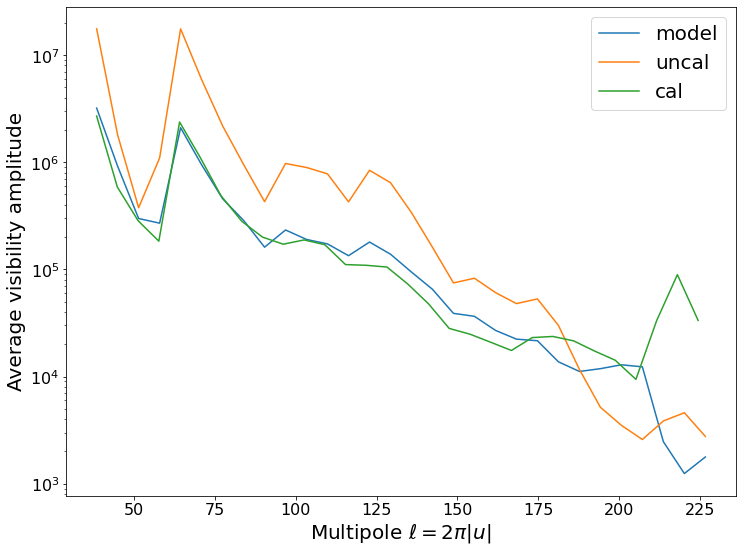

In [53]:
fig, ax = plt.subplots(figsize=(12,9))
ax.plot(bs_l_model, bs_vis_model, label="model")
ax.plot(bs_l_uncal, bs_vis_uncal, label="uncal")
ax.plot(bs_l_cal, bs_vis_cal, label="cal")
ax.set_xlabel('Multipole $\ell = 2 \pi |u|$', fontsize=20)
ax.set_ylabel('Average visibility amplitude', fontsize=20)
ax.tick_params(axis='both', which='both', labelsize=16)
ax.set_yscale('log')
ax.legend(loc='best', fontsize=20)